# Week 3 Data Driven Dynamical Systems 

## Exercises

### Exercise X03.1 
Reproduce the results presented of learning dynamics of Fluid flow past cylinder using a flowmap based on DMD. (i) Construct the DMD and visualize the first few eigenvectors of the full system matrix A, (ii) Perform a flowmap to time step 200 from the initial step 0. Evaluate how errors develop in time up to time step 150 were data is available for different choices of the truncation parameter r. Make sure to describe how the model is produced and visualize the results.

I start by importing necessary libraries 

In [103]:
# Importing the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colormaps
from matplotlib import animation
from IPython.display import HTML
from scipy.io import loadmat
from scipy.linalg import eigvals, lstsq, svdvals,svd
from scipy.sparse.linalg import svds
from scipy.integrate import solve_ivp
from sklearn.metrics import mean_squared_error

plt.rcParams["animation.html"] = "jshtml"

Loading the data

In [104]:
# Load the data
# check if on mac or windows
import platform
if platform.system() == 'Darwin':
    path = r'data/fluids/CYLINDER_ALL.mat'
else:
    path = r'data\fluids\CYLINDER_ALL.mat'
data = loadmat(path)



# Extract the data
X = data['UALL']
nx = data['nx'][0,0]
ny = data['ny'][0,0]
m = data['m'][0,0]
n = data['n'][0,0]

I define and load the DMD function given by the slides and the Datadriven Science and Engineering book 

In [105]:
import numpy as np
def DMD(X, Xprime, r):
    """
    Perform Dynamic Mode Decomposition (DMD) on input data matrices.

    Parameters:
    - X: A NumPy array of shape (n, m), where n is the number of variables and m is the number of temporal snapshots. This matrix represents the state of the system at the initial time.
    - Xprime: A NumPy array of shape (n, m), similar to X, representing the state of the system at a later time.
    - r: Integer, the number of DMD modes to compute, which also acts as a dimensionality reduction parameter by focusing on the r most significant dynamic modes.

    Returns:
    - Phi: A matrix of shape (n, r), whose columns are the DMD modes that represent the dynamic structures of the system.
    - Lambda: A diagonal matrix of shape (r, r) containing the eigenvalues associated with each DMD mode. These eigenvalues reflect the growth rates and frequencies of the modes.
    - b: An array of shape (r,), representing the amplitudes of each DMD mode, indicating their contribution to the initial state of the system.
       """
    # Compute the economy-size SVD of the input data matrix X
    U, Sigma, VT = np.linalg.svd(X, full_matrices=False)
    # Truncate the matrices to keep only the r most significant modes
    Ur = U[:, :r]
    Sigmar = np.diag(Sigma[:r])
    VTr = VT[:r, :]
    # Compute the Atilde matrix
    Atilde = np.linalg.solve(Sigmar.T, (Ur.T @ Xprime @ VTr.T).T).T
    # Compute the eigendecomposition of Atilde
    Lambda, W = np.linalg.eig(Atilde)
    # Compute the DMD modes
    Phi = Xprime @ np.linalg.solve(Sigmar.T, VTr).T @ W
    # Compute the DMD amplitudes
    alpha1 = Sigmar @ VTr[:, 0] # Initial state
    # Solve for the amplitudes
    b = np.linalg.solve(W @ np.diag(Lambda), alpha1)
    return Phi, Lambda, b

Do a Dynamic mode Decomposition for the data where 21 modes are computed. 

In [106]:
#Doing Dynamic Mode Decomposition

Phi, Lambda, b = DMD(X[:,:-1],X[:,1:],21)

Plotting the DMD Eigenvalues 

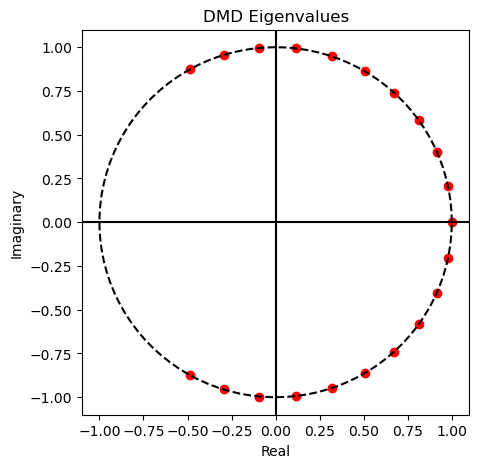

In [107]:
# Plotting the DMD modes
plt.figure(figsize=(5,5))
plt.plot((Lambda.real),(Lambda.imag),'ro')
# add axis 
plt.axhline(y=0, color='k')
plt.axvline(x=0, color='k')
# plot the unit circle to show stability
theta = np.linspace(0,2*np.pi,100)
plt.plot(np.cos(theta),np.sin(theta),'k--')
plt.xlabel('Real')
plt.ylabel('Imaginary')
plt.title('DMD Eigenvalues')
plt.show()



Using what I learned about analysis of DMD eigenvalues in week 1, I conclude the following:$\newline$ The eigenvalues all have a magnitude of 1 and thus the modes they represent are neither growing or decaying except one that are situated directly in origo of the real and imaginary plane. I.E an eigenvalue that is zero. This means that almost all modes keep their energy and it is furthermore interesting that the frequencies they show are equally spaced around the unit circle. The zero eigenvalue indicates that the mode does not affect the system dynamics and is steady. Furthermore also that the system might be rank defficient. 

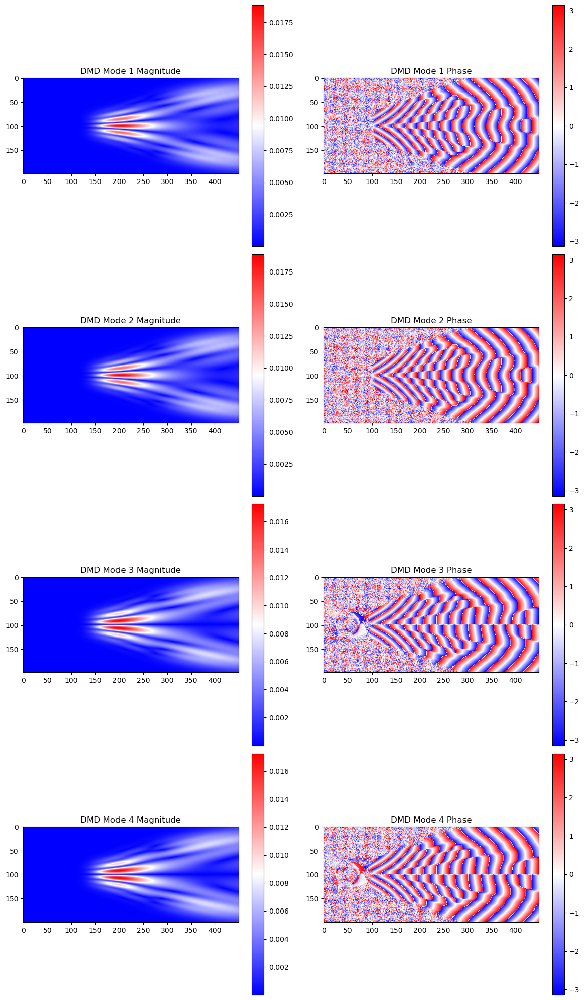

In [108]:
plt.figure(figsize=(12, 20))  # Adjust figure size for a 4x2 grid layout

for i in range(4):
    # Plot magnitude of the ith DMD mode
    plt.subplot(4, 2, 2*i + 1)  # Places magnitude plot in the left column
    mode_magnitude = np.reshape(np.abs(Phi[:, i]), (nx, ny), order='F')
    plt.imshow(mode_magnitude)
    plt.colorbar(location='right')
    plt.set_cmap('bwr')
    plt.title(f'DMD Mode {i+1} Magnitude')

    # Plot phase of the ith DMD mode
    plt.subplot(4, 2, 2*i + 2)  # Places phase plot in the right column
    mode_phase = np.reshape(np.angle(Phi[:, i]), (nx, ny), order='F')
    plt.imshow(mode_phase)
    plt.colorbar(location='right')
    plt.set_cmap('bwr')
    plt.title(f'DMD Mode {i+1} Phase')

plt.tight_layout()
plt.show()


From the the different modes phases and magnitude plots it looks like the modes are somewhat similar but different timed versions of the same wave motion. It can be seen how most energy in the system is in the wake of the cylinder in the middle and then in an outward arrow shape from that. 

### ii
I start by making the flowmap for t = 0..151 so I can evaluate the performance of the DMD flowmap as a function of the truncation parameter r. 

In [109]:
import numpy as np
r_values = [1,3,8,20,50,100]  # List of truncation parameters to test
n_times = 200  # Total number of time steps to predict 
# only 151 time steps are available in the dataset
available_data_time = 151

# make a vector to store the error for each r for the available data time
# dimension should be len(r_values) x available_data_time
errors_r = np.zeros((len(r_values), available_data_time))




# Assuming X and Xprime are defined, and r_values is defined
dt = 1  # Time step size between snapshots in your dataset

# Loop over different truncation parameters to test
for r in r_values:
    Phi, Lambda, b = DMD(X[:, :-1], X[:, 1:], r)
    
    # Convert Lambda to continuous-time eigenvalues
    omega = np.log(Lambda) / dt

    # Define time steps for reconstruction
    timesteps = np.linspace(0, n_times, num=n_times+1)  # Adjust as per your specific needs

    # Precompute the temporal matrix for all timesteps (for efficiency)
    T_omega = np.exp(omega[:, None] * timesteps)

    # Reconstruction for each time step
    # Dimension is 89351,1, n_times + 1
    # Reduce dimension to 89351, n_times + 1
    X_dmd = np.dot(Phi, np.dot(np.diag(b), T_omega))
    
    # Example of calculating error for available data time
    errors = []
    for t in range(available_data_time):
        actual_state = X[:, t]
        dmd_state = X_dmd[:, t]
        error = np.linalg.norm(actual_state - dmd_state)
        errors.append(error)
    errors_r[r_values.index(r), :] = errors
    # Visualize or analyze the errors for each r (this is just a placeholder, adjust according to your needs)
    print(f'Errors for r={r}:', errors)


Errors for r=1: [40.39699495588406, 40.33284550216549, 40.31135798653768, 40.32174034179145, 40.33122477902671, 40.308925643174376, 40.25583738652203, 40.20426864310891, 40.18529171516264, 40.20129967894987, 40.22515645190139, 40.219785073165006, 40.162192685518846, 40.05637357772437, 39.929985896505315, 39.82171259610343, 39.76618107981952, 39.78009241605609, 39.85282092893325, 39.948762203023094, 40.029980918393136, 40.08834992723393, 40.14965450843549, 40.24270355625436, 40.36953820898056, 40.50168388614745, 40.5982362531779, 40.629992493019145, 40.59384483028108, 40.51122673161525, 40.41670669208283, 40.3440064804146, 40.31265178385287, 40.31802051197832, 40.331073279859304, 40.31748434047148, 40.26936159657552, 40.21403907793713, 40.18608071657217, 40.19557971376697, 40.220970810156174, 40.2252134613128, 40.180335103723856, 40.083871829346684, 39.95895292783671, 39.84304916887026, 39.77303273654359, 39.77080677737084, 39.832433293687615, 39.926860535197775, 40.013659333189075, 40.

It is clear that with increasing amount of DMD modes you get an increased accuracy in the approximation of the data 

To better show this I will plot the error for the different truncation values for the different timesteps 

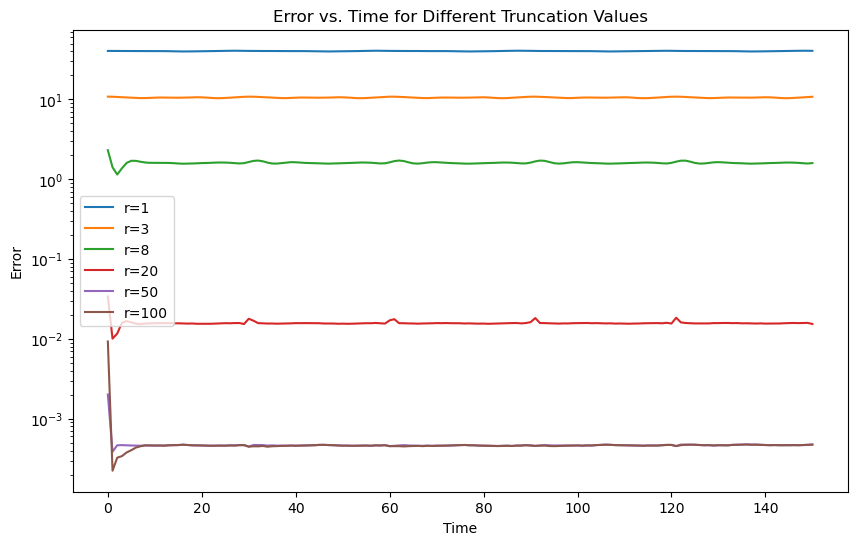

In [110]:
# Plot the error in relation to the time for each truncation value r 
plt.figure(figsize=(10, 6))
for i, r in enumerate(r_values):
    plt.semilogy(range(available_data_time), errors_r[i, :], label=f'r={r}')
plt.xlabel('Time')
plt.ylabel('Error')
plt.title('Error vs. Time for Different Truncation Values')
plt.legend()
plt.show()


It seems that around r = 50..100 there is no significant gain in accuracy for the prediction of the future state. This is tied to the fact that the system dynamics are captured effectively by a few eigenmodes and while in theory 151 modes are available, only a few of the are needed to accurately represent the system dynamics. 

I define a helper function to do futures state predictions of the system using the DMD mode function I already have defined. 

In [111]:
def DMD_future_state(X,r,dt,n_times):
        Phi, Lambda, b = DMD(X[:, :-1], X[:, 1:], r)
        
        # Convert Lambda to continuous-time eigenvalues
        omega = np.log(Lambda) / dt

        # Define time steps for reconstruction
        timesteps = np.linspace(0, n_times, num=n_times+1)  # Adjust as per your specific needs

        # Precompute the temporal matrix for all timesteps (for efficiency)
        T_omega = np.exp(omega[:, None] * timesteps)

        # Reconstruction for each time step
        X_dmd = np.dot(Phi, np.dot(np.diag(b), T_omega))
        return X_dmd

I then use the functions to predict the systems from t = 0..200 

In [112]:
# Predict the future state of the system from 0 to 200
t_end = 200  # End time for prediction
X_dmd = DMD_future_state(X, 21, 1, t_end) # Future state prediction
frames = len(X_dmd[1]) # number of frames in the animation
X_3D_dmd = np.reshape(X_dmd, (nx, ny, frames), order='F') # Reshape the data for plotting

I animate the cylinder fluid flow system as predicted by the DMD decomposition representation with 21 modes from t=0..200 whereoff the t = 152..200 are outside the original datas timeframe. 

In [113]:

n_times = 200  # Total number of time steps to predict
timesteps = np.linspace(0, t_end, num=n_times+1)

# update_contourf
def update_contourf(frame,data,ax,timesteps):
    ax.clear()
    cont = ax.contourf(data[:,:,frame])
    # Re-set the title after clearing
    ax.set_title('DMD Future State Prediction\n t=[0;200]')
    
    # Add time annotation
    time = timesteps[frame]
    ax.text(0.9, 0.9, f't = {time:.2f}', transform=ax.transAxes, ha='right', va='top', fontsize=10, color='red')
    
    return cont


# Create the figure and axis
fig, ax = plt.subplots()

fig.set_size_inches(8, 4)

ax.set_title('DMD Future state prediction\n t=[0;200]')
ax.set(xlim=(0, n), ylim=(0, m),aspect='equal', xlabel='x', ylabel='y')
# Set the colormap to viridis
plt.set_cmap('viridis')

ani = animation.FuncAnimation(fig, update_contourf, frames=frames, fargs=(X_3D_dmd,ax,timesteps), interval=100, blit=False)

output = HTML(ani.to_jshtml())
display(output)

plt.close()


/Users/dkmathlu/Documents/Datadriven Science and Engineering/Week_6/.conda/lib/python3.10/site-packages/matplotlib/contour.py:1578: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmax = z.max().astype(float)
/Users/dkmathlu/Documents/Datadriven Science and Engineering/Week_6/.conda/lib/python3.10/site-packages/matplotlib/contour.py:1579: ComplexWarning: Casting complex values to real discards the imaginary part
  self.zmin = z.min().astype(float)
/Users/dkmathlu/Documents/Datadriven Science and Engineering/Week_6/.conda/lib/python3.10/site-packages/numpy/ma/core.py:2826: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,


I observe that the predicted future state flow shows in the same patterns as from the actual fluid flow. This makes sense as the nature of DMD is that it based on the data predicts future states of the system and in this case it gave modes where the eigenvalues predicted that the system modes would neither grow exponentialle or decrease in time. Thus the modes must be showing time invariant patterns that repeat periodically. The complexity of the motion comes from the fact that there are several modes that significantly influence the fluid motion at the same time. This however only holds true for this specific dataset and for each dataset a new analysis of the data is required.  

### Exercise 7.4 (follow tutorial)
 Identify a SINDy model for the Lorenz system using PySINDy, Book, Chapter 7, page 307.

## The following is based on the pySINDY lecture modules found at: https://github.com/dynamicslab/pysindy/blob/master/examples/15_pysindy_lectures.ipynb

(a)Generate a long trajectory with a fine sampling rate of ∆t = 0.0001; dis- card the first t = 1 of the data. Use SINDy to generate models using an increasing length of data T. At what T is it possible to identify the cor- rect Lorenz mode? Plot the data up until T . Do the results surprise you? (Explain why.)

I start by importing necessarry libraries

In [114]:
import numpy as np
import matplotlib.pyplot as plt
import pysindy as ps
from scipy.integrate import solve_ivp
from pysindy.utils import lorenz


Then I set the parameters for the integration method of the Lorenz system

In [115]:
# Seed the random number generators for reproducibility
np.random.seed(123)

# Initialize integrator keywords for solve_ivp to replicate the odeint defaults
integrator_keywords = {}
integrator_keywords['rtol'] = 1e-12
integrator_keywords['method'] = 'LSODA'
integrator_keywords['atol'] = 1e-12

Then I simulate the Lorenz system for T = 10

In [116]:
# define the testing and training Lorenz data we will use for these examples
dt = 0.0001

t_train = np.arange(0, 10, dt)
x0_train = [-8, 8, 27]
t_train_span = (t_train[0], t_train[-1])
x_train = solve_ivp(
    lorenz, t_train_span, x0_train, t_eval=t_train, **integrator_keywords
).y.T

t_test = np.arange(0, 15, dt)
t_test_span = (t_test[0], t_test[-1])
x0_test = np.array([8, 7, 15])
x_test = solve_ivp(
    lorenz, t_test_span, x0_test, t_eval=t_test, **integrator_keywords
).y.T




# Plotting the training Lorenz dataset 

First I plot the variabels variying over time as a 2D plot

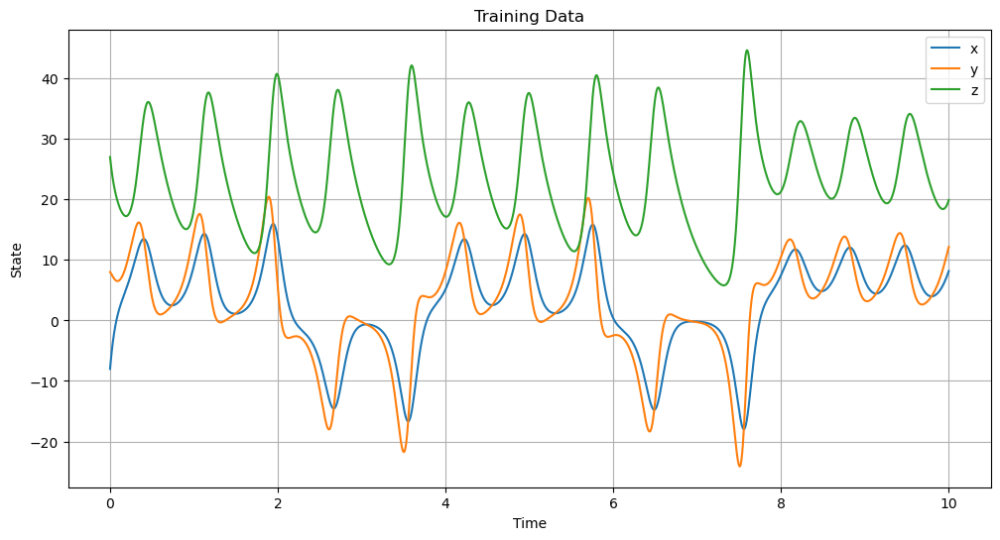

In [117]:
# Plot the training data
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.plot(t_train, x_train)
ax.set(xlabel='Time', ylabel='State', title='Training Data')
plt.grid()
plt.legend(['x', 'y', 'z'])
plt.show()


Then I plot the Lorenz attractor as a 3D plot

Text(0.5, 0, 'z')

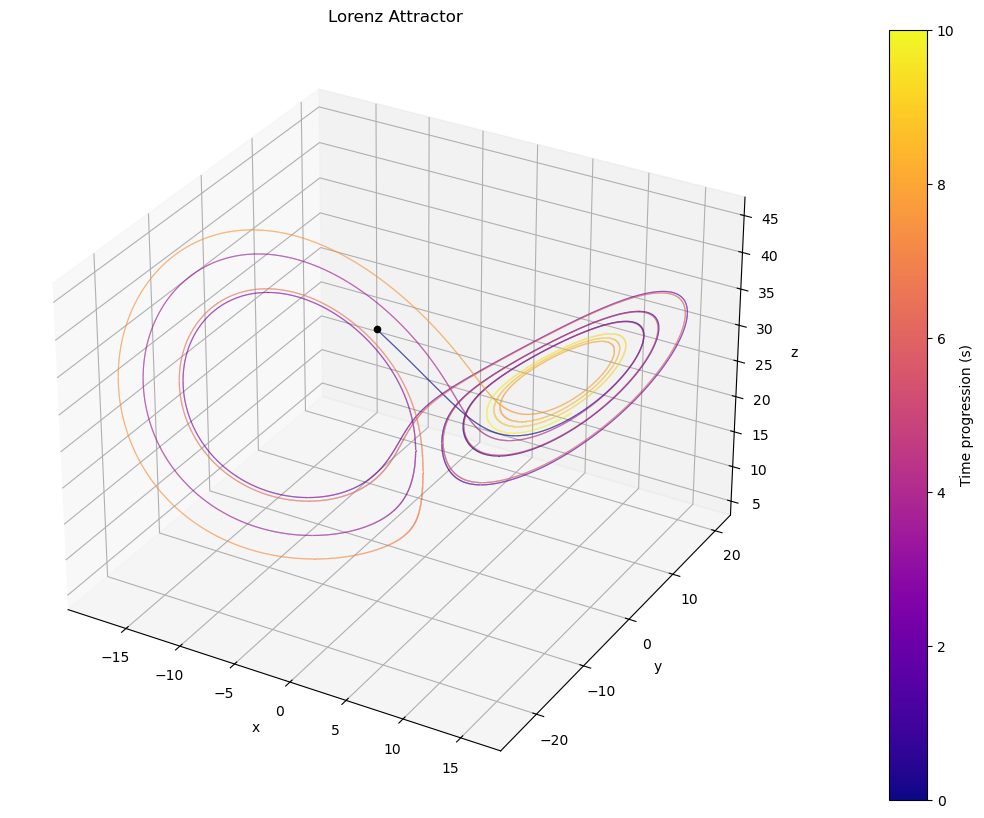

In [118]:
# Set size of the figure
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Add the starting point to the plot in black
ax.scatter(x_train[0, 0], x_train[0, 1], x_train[0, 2], color='black')

# Set the color of the curve to change along the curve from blue to red
n = len(x_train)
colors = plt.cm.plasma(np.linspace(0, 1, n))
for i in range(n-1):
    ax.plot(x_train[i:i+2, 0], x_train[i:i+2, 1], x_train[i:i+2, 2], color=colors[i], linestyle='dotted', linewidth=0.8)

# Show colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.plasma, norm=plt.Normalize(vmin=0, vmax=n*dt))
cbar = plt.colorbar(sm, ax=ax, pad=0.1)
cbar.set_label('Time progression (s)')

# Plot settings
ax.set_title('Lorenz Attractor')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

The lorenz attractor is a spiral starting from the defined starting point at x0 = -8,8,27 shown in black and where the color changes from blue to red as the lorenz attractor spirals forms over time

I then instantiate the groundtruth model using pySINDY. 

To do this I will first select a sparsifying parameter Lambda to use on the dataset. This sparsifying parameter is seen in the convex L1 optimization problem that pySINDY solves: 
$$
\boldsymbol{\xi}_k=\underset{\boldsymbol{\xi}_k^{\prime}}{\operatorname{argmin}}\left\|\dot{\mathbf{X}}_k-\boldsymbol{\Theta}(\mathbf{X}) \boldsymbol{\xi}_k^{\prime}\right\|_2+\lambda\left\|\boldsymbol{\xi}_k^{\prime}\right\|_1 .
$$

Here, $\dot{\mathbf{X}}_k$ is the $k$ th column of $\dot{\mathbf{X}}$, and $\lambda$ is a sparsity-promoting knob. 

Thus $\lambda$ acts as a knob to determine how big a penalty for non sparse models we want to apply to the L1 Convex optimization problem. 

This is problem dependent and has to be found experimentally. I do this by doing a line search for the optimale sparsity parameter value for the generated Lorenz attractor. 

I proceed to do this line search for optimale lambda values by using the following code found in:https://github.com/dynamicslab/pysindy/blob/master/examples/15_pysindy_lectures.ipynb 

First I define the helper function plotting the sparsity parameter scan

In [119]:
def plot_pareto(coefs, opt, model, threshold_scan, x_test, t_test):
    dt = t_test[1] - t_test[0]
    mse = np.zeros(len(threshold_scan))
    mse_sim = np.zeros(len(threshold_scan))
    for i in range(len(threshold_scan)):
        opt.coef_ = coefs[i]
        mse[i] = model.score(x_test, t=dt, metric=mean_squared_error)
        x_test_sim = model.simulate(x_test[0, :], t_test, integrator="odeint")
        if np.any(x_test_sim > 1e4):
            x_test_sim = 1e4
        mse_sim[i] = np.sum((x_test - x_test_sim) ** 2)
    plt.figure()
    plt.semilogy(threshold_scan, mse, "bo")
    plt.semilogy(threshold_scan, mse, "b")
    plt.ylabel(r"$\dot{X}$ RMSE", fontsize=20)
    plt.xlabel(r"$\lambda$", fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.grid(True)
    plt.figure()
    plt.semilogy(threshold_scan, mse_sim, "bo")
    plt.semilogy(threshold_scan, mse_sim, "b")
    plt.ylabel(r"$\dot{X}$ RMSE", fontsize=20)
    plt.xlabel(r"$\lambda$", fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.grid(True)

Then I do the line search / scan 

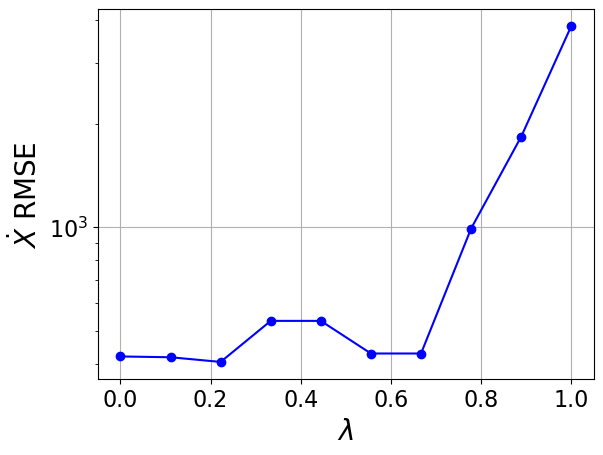

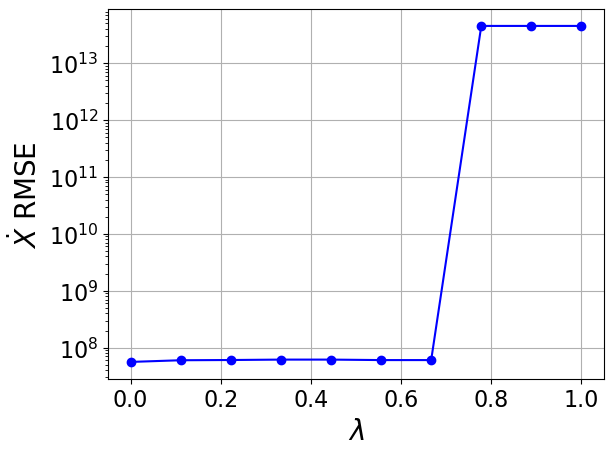

In [120]:
threshold_scan = np.linspace(0, 1.0, 10)
coefs = []
feature_names = ['x', 'y', 'z']
rmse = mean_squared_error(x_train, np.zeros(x_train.shape), squared=False)
x_train_added_noise = x_train + np.random.normal(0, rmse / 10.0,  x_train.shape)
for i, threshold in enumerate(threshold_scan):
    sparse_regression_optimizer = ps.STLSQ(threshold=threshold)
    model = ps.SINDy(feature_names=feature_names, 
                     optimizer=sparse_regression_optimizer)
    model.fit(x_train_added_noise, t=dt, quiet=True)
    coefs.append(model.coefficients())
    
plot_pareto(coefs, sparse_regression_optimizer, model, 
            threshold_scan, x_test, t_test)

I select the sparsifying weighting parameter lambda to be, lambda = 0.2

In [121]:
# Instantiate and fit the SINDy model
feature_names = ['x', 'y', 'z']
sparse_regression_optimizer = ps.STLSQ(threshold=0.2)  # default is lambda = 0.1
model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
groundtruth_model= model.fit(x_train, t=dt)
groundtruth_model.print()
# I start by defining the optimal coefficients for the model
coefs = groundtruth_model.coefficients()

(x)' = -10.000 x + 10.000 y
(y)' = 28.000 x + -1.000 y + -1.000 x z
(z)' = -2.667 z + 1.000 x y


This generates the correct model and I proceed with my investigation of the pySindy model on the data

To start with I will discard the first second of the data as per the instructions of the data. It might be to do with avoiding transient behavior. But that is not something im sure of. 

In [122]:
# Discarding the first second of the data 
x_train_1_T = x_train[int(1/dt):,:]

# Confirm the shapes of the data
print(x_train_1_T.shape)
print(x_train.shape)

(90000, 3)
(100000, 3)


Next I will loop through various lengths of data to see how much time/ how many data points is needed to generate the correct model using the pySindy library

I start by doing a very coarse line search where I jump a 1000 points at a time for the step length  dt = 0.0001

In [123]:

# I define the time values
t = np.arange(1, 10, dt)


points = len(t)
# I preallocate a matrix to store the errors
errors = np.zeros((points, 2))

# I iterate over the time values
# First I do a very coarse search to confirm the error is decreasing
for i in range(10,points,1000):
    # I select the data up to the current time value
    x_train_t = x_train_1_T[:i, :]
    # I instantiate a new model
    model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
    # I fit the model to the data
    model.fit(x_train_t, t=dt)
    # I compute the error between the predicted model coefficient and the groundtruth coefficient
    errors[i,0] = np.linalg.norm(coefs - model.coefficients(),np.inf)
    # I compute the error between the true data and the model prediction
    errors[i,1] = model.score(x_train_1_T, t=dt, metric=mean_squared_error)

I then proceed to plot the results

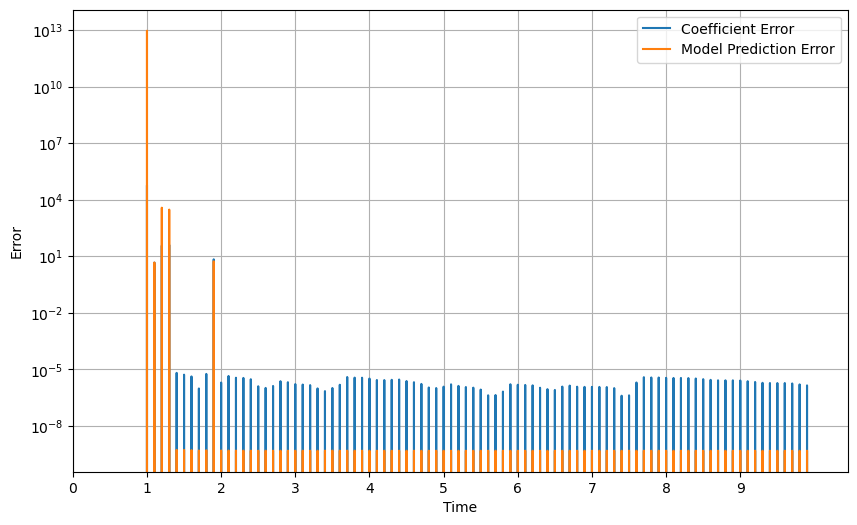

In [124]:
# I plot the errors
plt.figure(figsize=(10, 6))
plt.semilogy(t, errors[:,0], label='Coefficient Error')
plt.semilogy(t, errors[:,1], label='Model Prediction Error')
plt.xlabel('Time')
plt.ylabel('Error')
# x ticks for every second 
plt.xticks(np.arange(0, 10, 1))
# add grid
plt.grid()
plt.legend()
plt.show()

I conclude that convergence to the optimal model is between 1.2 and 2 seconds worth of points.

Therefore I do a finer linesearch in this area where I only jump 10 datapoints at once meaning $\Delta t = 0.001$

In [125]:
# Then I do a fine search in t = 1 .. 2
# I define the time values
t = np.arange(1, 2, dt)

points = len(t)
# I preallocate a matrix to store the errors
errors = np.zeros((points, 2))

# I iterate over the time values
for i in range(10,points,10):
    # I select the data up to the current time value
    x_train_t = x_train_1_T[:i, :]
    # I instantiate a new model
    model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
    # I fit the model to the data
    model.fit(x_train_t, t=dt)
    # I compute the error between the predicted model coefficient and the groundtruth coefficient
    errors[i,0] = np.linalg.norm(coefs - model.coefficients(),np.inf)
    # I compute the error between the true data and the model prediction
    errors[i,1] = model.score(x_train_1_T, t=dt, metric=mean_squared_error)


I plot the results 

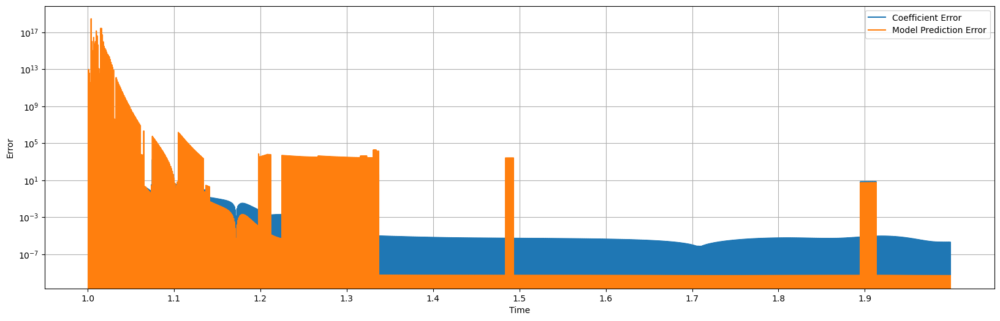

In [126]:
# I plot the errors
plt.figure(figsize=(20, 6))
plt.semilogy(t, errors[:,0], label='Coefficient Error')
plt.semilogy(t, errors[:,1], label='Model Prediction Error')
plt.xlabel('Time')
plt.ylabel('Error')
# x ticks for every 0.1 second
plt.xticks(np.arange(1, 2, 0.1))
# add grid
plt.grid()
plt.legend()
plt.show()

I further investigate the time frame between 1.35 and 1.50 seconds.

This time I only jump a single data point to get the finest possible line search with $\Delta t   = 0.0001$

In [127]:
# finer search in t = 1 .. 1.55
t = np.arange(1, 1.50, dt)

points = len(t)
# I preallocate a matrix to store the errors
errors = np.zeros((points, 2))

# I iterate over the time values
for i in range(10,points,1):
    # I select the data up to the current time value
    x_train_t = x_train_1_T[:i, :]
    # I instantiate a new model
    model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
    # I fit the model to the data
    model.fit(x_train_t, t=dt)
    # I compute the error between the predicted model coefficient and the groundtruth coefficient
    errors[i,0] = np.linalg.norm(coefs - model.coefficients(),np.inf)
    # I compute the error between the true data and the model prediction
    errors[i,1] = model.score(x_train_1_T, t=dt, metric=mean_squared_error)


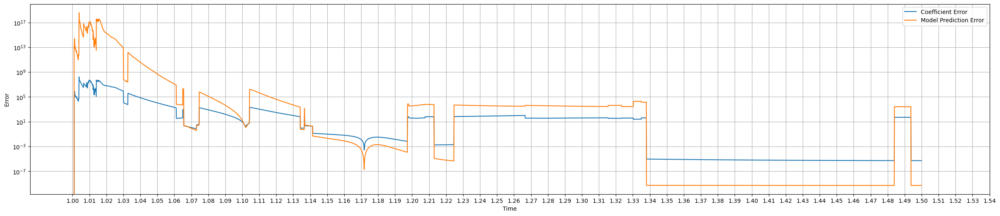

In [128]:
# I plot the errors
plt.figure(figsize=(30, 6))
plt.semilogy(t[:], errors[:,0], label='Coefficient Error')
plt.semilogy(t[:], errors[:,1], label='Model Prediction Error')
plt.xlabel('Time')
plt.ylabel('Error')
# x ticks for every 0.01 second
plt.xticks(np.arange(1, 1.55, 0.01))
# add grid
plt.grid()
plt.legend()
plt.show()

I conclude you need about 1.34 seconds to find the correct model for certain with a sparsity parameter $\lambda = 0.2$

I then proceed to quantify how many data point is it to get a correct identified model for the system using pySINDY with $\lambda = 0.2$. Here it is important to note that from Discovery of Nonlinear Multiscale Systems- Sampling Strategies and Embeddings (Champion et al) found the average attractor period to be 0.759 approximately for a system initiated with the same parameters as mine. I will use this as a reference for my calculations

In [129]:
t_necessary = 1.34
# 1.5 seconds of data is enough to get a good model
# how many data points is that?
print((t_necessary-1)/dt)
# From Chapion et al 2021, the period of the Lorenz system is T = 0.759
# how many data points is that?
print(0.759/dt)
# how much of a period is 1.5-1 seconds?
print((t_necessary-1)/0.759)

3400.0000000000005
7590.0
0.4479578392621872


So you need about 45% of the average lorenz attractor period to produce the correct model coefficients when using the sparsity parameter lambda = 0.2 

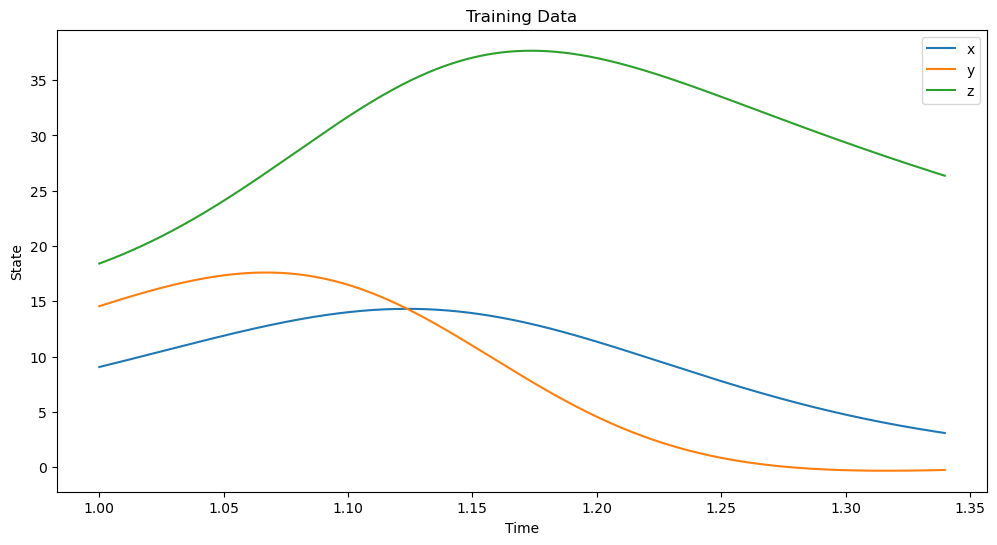

In [130]:
# I plot the lorenz model for the first 1 to 1.34 seconds
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.plot(t_train[int(1/dt):int(t_necessary/dt)], x_train[int(1/dt):int(t_necessary/dt)])
ax.set(xlabel='Time', ylabel='State', title='Training Data')
plt.legend(['x', 'y', 'z'])
plt.show()


It looks to be enough to have a bit less than a full sine wave period worth of data for x,y,z for Sindy to identify the correct coefficients. This alligns nicely with the results from champion et al. 

To further investigate I will also plot the necessary section of the lorenz attractor

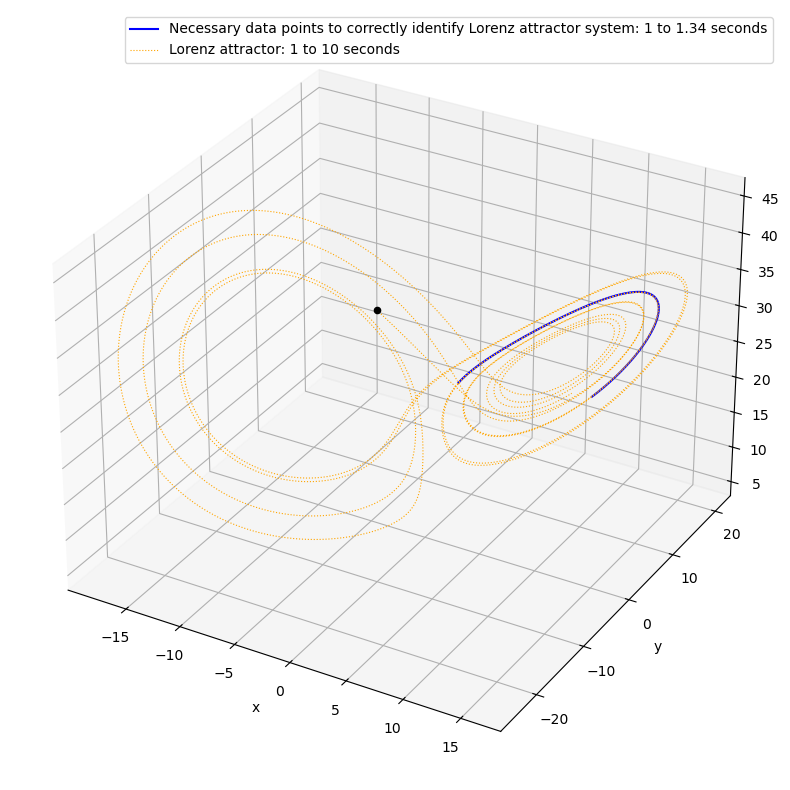

In [131]:
# Do the same for the lorenz attractor
# Here the blue line is from 1 to 1.5 seconds
# The rest of the lorenz attractor is in dotted orange
# set size of the figure
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
ax.plot(x_train[int(1/dt):int(t_necessary/dt), 0], x_train[int(1/dt):int(t_necessary/dt), 1], x_train[int(1/dt):int(t_necessary/dt), 2], 'b')
ax.plot(x_train[:, 0], x_train[:, 1], x_train[:, 2], 'orange', linestyle='dotted',linewidth=0.8)
# plot the starting point in black
ax.scatter(x_train[0, 0], x_train[0, 1], x_train[0, 2], color='black')
# legend
plt.legend(['Necessary data points to correctly identify Lorenz attractor system: 1 to 1.34 seconds', 'Lorenz attractor: 1 to 10 seconds '])
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
plt.show()

Looking at the lorenz attractor a similar conclusion can be found as it is seen that pySindy needs enough points for the lorenz attractor to make about 3/4 of a spiraling circular movement. It is surprising how it can identify the correct system before a full period of waves for x,y,z. 

Note worthy is that this alligns nicely with the findings in:
K. P. Champion, S. L. Brunton, and J. N. Kutz. Discovery of nonlinear multiscale systems: Sampling strategies and embeddings. SIAM Journal on Applied Dynamical Systems, 18(1):312–333, 2019. page 6 figure 2

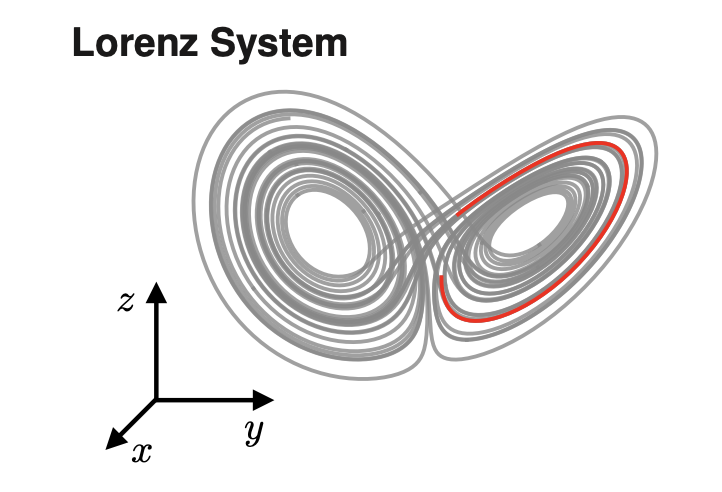

(b) Now, repeat this experiment for different sampling rates from t = 0.0001 to 0.1. How does the minimum data length T change? How does the num- ber of samples T/∆t change?

0.001


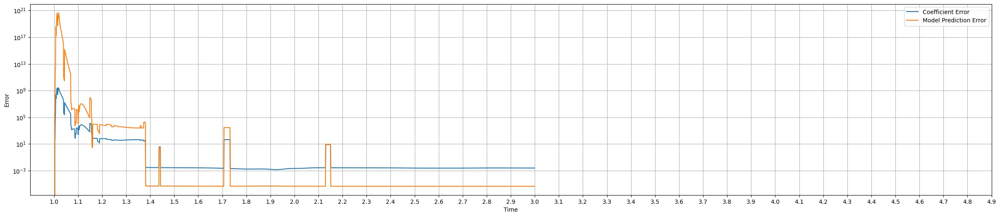

(x)' = -10.000 x + 10.000 y
(y)' = 27.998 x + -1.000 y + -1.000 x z
(z)' = -2.667 z + 1.000 x y
0.002534030745231286
0.01


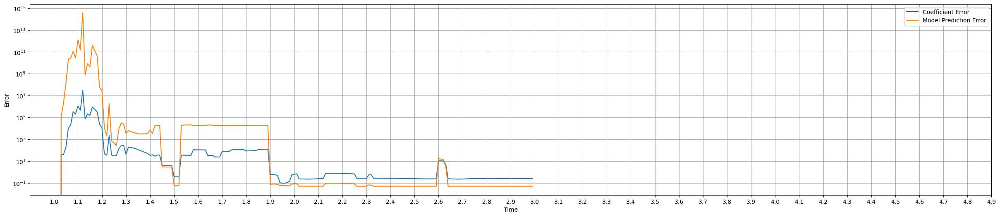

(x)' = -9.978 x + 9.978 y
(y)' = 27.794 x + -0.961 y + -0.994 x z
(z)' = -2.659 z + 0.997 x y
0.2513509593009532
0.1


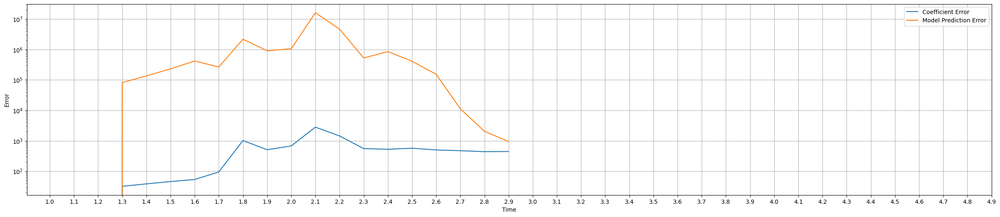

(x)' = -17.428 1 + -32.261 x + 23.893 y + 1.194 z + -0.407 x y + 0.618 x z + 0.251 y^2 + -0.394 y z
(y)' = -38.772 1 + -26.460 x + 27.697 y + 2.968 z + -0.644 x^2 + 0.310 x y + 0.474 x z + -0.688 y z
(z)' = -312.000 1 + 47.074 x + -21.968 y + 39.088 z + 7.624 x^2 + -6.543 x y + -1.212 x z + 1.827 y^2 + 0.463 y z + -1.329 z^2
442.7953082079912


In [132]:
# Repeating the experiment for different sampling rates from t = 0.0001 to t =0.1 
# See how the minimum data length T required to identify the correct model changes with the sampling rate
# I.E how the number of samples T/Delta_t change
coefs = groundtruth_model.coefficients()
# I start by allocating a logspace array of sampling rates to try
# I try 4 different sampling rates between 0.0001 and 0.1 
# I skip 0.0001 as I have already done this experiment
sampling_rates = np.logspace(-3, -1, 3) # 0.001, 0.01, 0.1
# I have the groundtruth model coefficients from the previous experiment
# preallocate a matrix to store the errors
# Preallocate to store the errors
for sampling_rate in sampling_rates:
    print(sampling_rate)
    dt = sampling_rate
    t_train = np.arange(0, 5, dt) # Sample from 0 to 5 seconds

    t_train_span = (t_train[0], t_train[-1])

    x_train = solve_ivp(
        lorenz, t_train_span, x0_train, t_eval=t_train, **integrator_keywords
    ).y.T
    
    
    
    # Discarding the first second of the data
    # It depends on the sampling rate
    s = np.where(t_train == 1)[0][0]
    x_train_1_T = x_train[s:,:]
    
    # finer search in t = 1..2
    t = np.arange(1, 3, dt)

    points = len(t)
    # I preallocate a matrix to store the errors
    errors = np.zeros((points, 2))

    # I iterate over the time values
    # First I do a very coarse search to confirm the error is decreasing
    for i in range(3,points,1): 
        # best model error 
        # start with infinity
        best_error = np.inf
        # I select the data up to the current time value
        x_train_t = x_train_1_T[:i, :]
        # I instantiate a new model
        model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
        # I fit the model to the data
        model.fit(x_train_t, t=dt)
        
        # I compute the error between the predicted model coefficient and the groundtruth coefficient
        errors[i,0] = np.linalg.norm(coefs - model.coefficients(),np.inf)
        if errors[i,0] < best_error:
            best_error = errors[i,0]
            best_model = model
        # I compute the error between the true data and the model prediction
        errors[i,1] = model.score(x_train_1_T, t=dt, metric=mean_squared_error)
        # I plot the errors
    plt.figure(figsize=(30, 6))
    plt.semilogy(t, errors[:,0], label='Coefficient Error')
    plt.semilogy(t, errors[:,1], label='Model Prediction Error')
    plt.xlabel('Time')
    plt.ylabel('Error')
    # x ticks for every 0.01 second
    plt.xticks(np.arange(1, 5, 0.1))
    # add grid
    plt.grid()
    plt.legend()
    plt.show()
    best_model.print()
    print(best_error)
    

In [133]:
# The optimal models for the different sampling rates are achieved at different times
# T_0.0001 = 1.5, T_0.001 = 1.75, T_0.01 = 1.95, T_0.1 = NaN
# Then I can calculate T/dt 
# T_0.0001/dt = 1.5/0.0001 = 15000
# T_0.001/dt = 1.75/0.001 = 1750
# T_0.01/dt = 1.95/0.01 = 195
print((1.5-1)/0.0001, (1.75-1)/0.001, (1.95-1)/0.01)

5000.0 750.0 95.0


It can be seen how a more coarse sampling rate will also result in a model with less accurate models. The best model will be less accurate. I suspect that a more aggresive sparsifying parameter lambda will make the more coarse sampling rates converge and closer to the groundtruth model.   The sampling size of $dt = 0.001, dt = 0.01$ convereged to the true model within 2 seconds. For the finer sampling rate it converged around 1.5 seconds and for the coarser it converged at 1.9 seconds

In [138]:
# 1.5 seconds of data is enough to get a good model for dt = 0.001
# how many data points is that?
print( " The necessary data points to get a good model for dt = 0.001 is ", (1.5-1)/0.001)
# From Chapion et al 2021, the period of the Lorenz system is T = 0.759
# how much of a period is 1.5-1 seconds?
print(" The necessary part of a Lorenz attractor period to get a good model for dt = 0.001 is ", (1.5-1)/0.759)


# 1.9 seconds of data is enough to get a good model for dt = 0.01
# how many data points is that?
print( " The necessary data points to get a good model for dt = 0.01 is ", (1.9-1)/0.01)
# From Chapion et al 2021, the period of the Lorenz system is T = 0.759
# how much of a period is 1.9-1 seconds?
print(" The necessary part of a Lorenz attractor period to get a good model for dt = 0.01 is ", (1.9-1)/0.759)


 The necessary data points to get a good model for dt = 0.001 is  500.0
 The necessary part of a Lorenz attractor period to get a good model for dt = 0.001 is  0.6587615283267457
 The necessary data points to get a good model for dt = 0.01 is  89.99999999999999
 The necessary part of a Lorenz attractor period to get a good model for dt = 0.01 is  1.185770750988142


So In conclusion, while the total amount of necessary data points are decreasing, the needed amount of data points for a lorenz attractor period increases. For dt = 0.0001 about 45% of an attractor period was needed, for dt = 0.001 it is 66% and for dt = 0.01 it is about 118% of an attractor period.

This can be explained as the model needs more of the total periodic motion for the variabels to compensate for the worse fidelity of the data.

In general it can be noted how it looks like the sampling rate and the error has a proportionality of about $\frac{1}{dt} \propto E^2 $

Meaning when the sampling rate goes from 0.001 to 0.01 I.E gets 10times coarse the best model error gets about 100 times worse.

However when the sampling rate 0.1 it is too coarse, the best model produced is not accurate to the groundtruth model at all and the best error is more than 1000 times the best error for 0.01 samplin rate. Meaning the scaling of the error decouples from the sampling rate. 

(c) Repeat the experiment with small additive Gaussian noise on the trajec- tory. With noise, repeat the identification for several noise realizations to obtain an average success rate. Also try different noise magnitudes. Re- peat the main figure in the Champion et al. [167] paper.

I Do not know what the main figure in champion et al is as there are several figures and none of them shows anything related to noise realisations

I will produce my own investigation of the matter. 

I reproduce the same model as earlier

In [265]:
dt = 0.0001
t_train = np.arange(0, 10, dt)
x0_train = [-8, 8, 27]
t_train_span = (t_train[0], t_train[-1])
x_train = solve_ivp(
    lorenz, t_train_span, x0_train, t_eval=t_train, **integrator_keywords
).y.T

# Instantiate and fit the SINDy model
feature_names = ['x', 'y', 'z']
sparse_regression_optimizer = ps.STLSQ(threshold=0.2)  # default is lambda = 0.1
model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
groundtruth_model= model.fit(x_train, t=dt)
groundtruth_model.print()
# I start by defining the optimal coefficients for the model
coefs = groundtruth_model.coefficients()

(x)' = -10.000 x + 10.000 y
(y)' = 28.000 x + -1.000 y + -1.000 x z
(z)' = -2.667 z + 1.000 x y


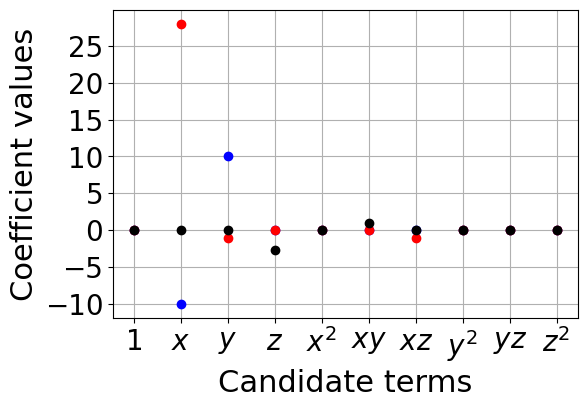

In [266]:
# Make a plot of the ground truth coefficients


def plot_ground_truth(model, ground_truth_coefs):
    xticknames = model.get_feature_names()
    colors = ["b", "r", "k"]
    for i in range(10):
        xticknames[i] = "$" + xticknames[i] + "$"
    plt.figure(figsize=(6, 4))
    plt.xlabel("Candidate terms", fontsize=22)
    plt.ylabel("Coefficient values", fontsize=22)
    for i in range(3):
        plt.plot(
            range(10),
            ground_truth_coefs[i, :],
            "o",
            color=colors[i],
            label=r"Equation for $\dot{" + feature_names[i] + r"}$",
        )
    ax = plt.gca()
    plt.grid(True)
    ax.set_xticks(range(10))
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.set_xticklabels(xticknames, verticalalignment="top")
    

# plot 
plot_ground_truth(model, ground_truth_coefs)

I then proceed to test the effect of gaussian noise for pySindy to be able to correctly identify the model. Here I will investigate how ensemble methods can be used to mitigate gaussian noise

I start by fitting a single SINDY model on the data with 2.5% gaussian noise as an example

In [291]:
# Fit a regular SINDy model with 2.5% added Gaussian noise
# random seed for reproducibility
np.random.seed(123)
rmse = mean_squared_error(x_train, np.zeros(x_train.shape), squared=False)
x_train_added_noise = x_train + np.random.normal(0, rmse /40,  x_train.shape)
sparse_regression_optimizer = ps.STLSQ(threshold=0.2)
model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
model.fit(x_train_added_noise, t=dt)
model.print()

(x)' = -9.733 x + 9.751 y
(y)' = -0.419 1 + 28.824 x + -1.368 y + -1.014 x z
(z)' = -50.168 1 + -0.500 x^2 + 1.301 x y


It can be seen that for this instance of the model the fit was not entirely succesful and only got some parameters correct. It wrongly determined that z' had an offset by -50.0168. 

Next I will test the ensemble method where several models are generated and the average is used to predict the correct model. This is done to avoid overfitting and to test the robustness of the pysindy algorithm.

In [292]:
# Fit many SINDy models with 2.5% added Gaussian noise
model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
model.fit(x_train_added_noise, t=dt, ensemble=True, quiet=True)
ensemble_coefs = model.coef_list

# Get average and standard deviation of the ensemble model coefficients
mean_ensemble = np.mean(ensemble_coefs, axis=0)
std_ensemble = np.std(ensemble_coefs, axis=0)

Next is ensemble where the candidate terms in the feature library is subsampled for the ensemble method to eliminate bias.

In [293]:
# Now we sub-sample the library, generating multiple models. 
# The default sampling omits a single library term.
model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
model.fit(x_train, t=dt, library_ensemble=True, quiet=True)
library_ensemble_coefs = model.coef_list

# Get average and standard deviation of the library ensemble model coefficients
mean_library_ensemble = np.mean(library_ensemble_coefs, axis=0)
std_library_ensemble = np.std(library_ensemble_coefs, axis=0)

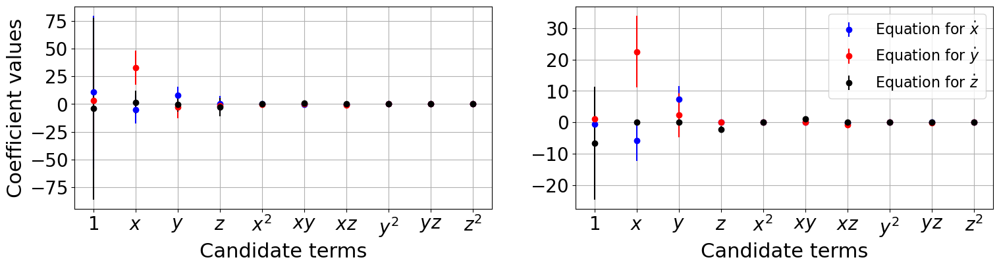

In [294]:
# aaand 
# Extract ground truth coefficients
ground_truth_coefs = model.coefficients()
# Make an errorbar coefficient plot from the results of ensembling
def plot_ensemble_results(
    model, mean_ensemble, std_ensemble, mean_library_ensemble, std_library_ensemble
):
    # Plot results
    xticknames = model.get_feature_names()
    for i in range(10):
        xticknames[i] = "$" + xticknames[i] + "$"
    plt.figure(figsize=(18, 4))
    colors = ["b", "r", "k"]
    plt.subplot(1, 2, 1)
    plt.xlabel("Candidate terms", fontsize=22)
    plt.ylabel("Coefficient values", fontsize=22)
    for i in range(3):
        plt.errorbar(
            range(10),
            mean_ensemble[i, :],
            yerr=std_ensemble[i, :],
            fmt="o",
            color=colors[i],
            label=r"Equation for $\dot{" + feature_names[i] + r"}$",
        )
    ax = plt.gca()
    plt.grid(True)
    ax.set_xticks(range(10))
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    ax.set_xticklabels(xticknames, verticalalignment="top")
    plt.subplot(1, 2, 2)
    plt.xlabel("Candidate terms", fontsize=22)
    for i in range(3):
        plt.errorbar(
            range(10),
            mean_library_ensemble[i, :],
            yerr=std_library_ensemble[i, :],
            fmt="o",
            color=colors[i],
            label=r"Equation for $\dot{" + feature_names[i] + r"}$",
        )
    ax = plt.gca()
    plt.grid(True)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.legend(fontsize=16, loc="upper right")
    ax.set_xticks(range(10))
    ax.set_xticklabels(xticknames, verticalalignment="top")

plot_ensemble_results(
    model, 
    mean_ensemble, 
    std_ensemble, 
    mean_library_ensemble, 
    std_library_ensemble
)

Following this I will use the same code noise magnitudes of 0.1%,1%,2.5 and 5% gaussian noise.

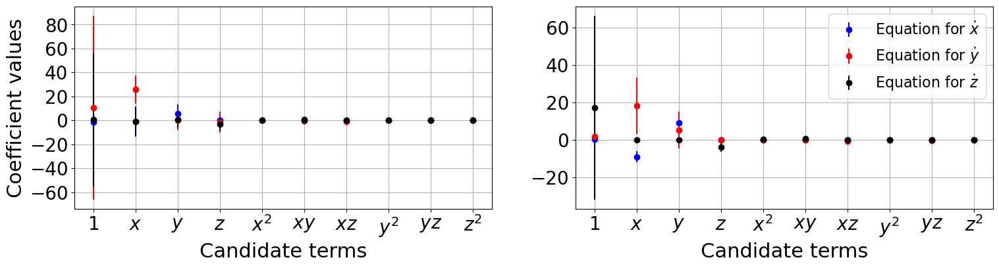

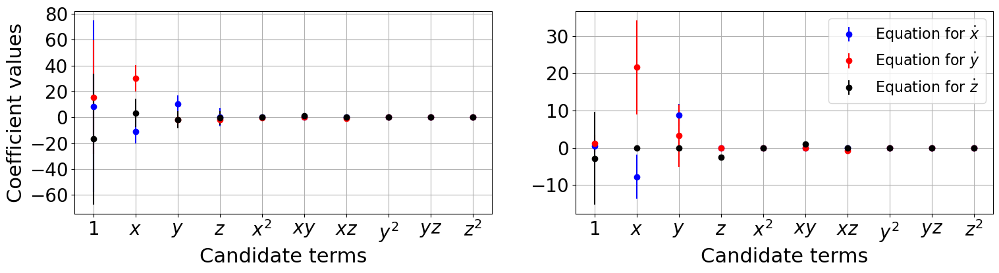

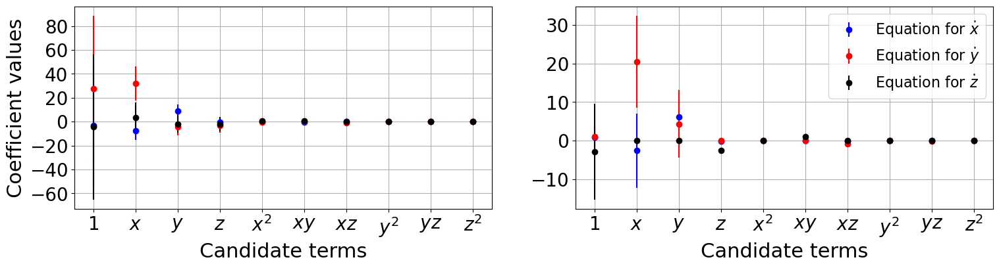

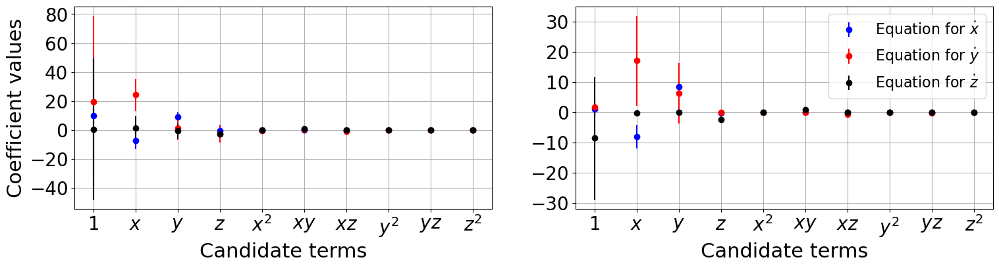

In [295]:
rmse = mean_squared_error(x_train, np.zeros(x_train.shape), squared=False)
# 0.1%,1%,2.5%,5% noise
# Set random seed for reproducibility
np.random.seed(123)
x_train_added_noise_01 = x_train + np.random.normal(0, rmse /1000,  x_train.shape)
x_train_added_noise_1 = x_train + np.random.normal(0, rmse /100,  x_train.shape)
x_train_added_noise_25 = x_train + np.random.normal(0, rmse /40,  x_train.shape)
x_train_added_noise_5 = x_train + np.random.normal(0, rmse /20,  x_train.shape)

# Have them in a single array to iterate through 
x_trains_added_noise = [x_train_added_noise_01, x_train_added_noise_1, x_train_added_noise_25, x_train_added_noise_5]
sparse_regression_optimizer = ps.STLSQ(threshold=0.3)

for x_train_train_added_noise in x_trains_added_noise:
    model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
    model.fit(x_train_added_noise, t=dt)
    # Fit many SINDy models with 2.5% added Gaussian noise
    model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
    model.fit(x_train_added_noise, t=dt, ensemble=True, quiet=True)
    ensemble_coefs = model.coef_list
    # Get average and standard deviation of the ensemble model coefficients
    mean_ensemble = np.mean(ensemble_coefs, axis=0)
    std_ensemble = np.std(ensemble_coefs, axis=0)
    # Now we sub-sample the library, generating multiple models. 
    # The default sampling omits a single library term.
    model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
    model.fit(x_train, t=dt, library_ensemble=True, quiet=True)
    library_ensemble_coefs = model.coef_list

    # Get average and standard deviation of the library ensemble model coefficients
    mean_library_ensemble = np.mean(library_ensemble_coefs, axis=0)
    std_library_ensemble = np.std(library_ensemble_coefs, axis=0)


    plot_ensemble_results(
        model, 
        mean_ensemble, 
        std_ensemble, 
        mean_library_ensemble, 
        std_library_ensemble
    )

Overall It seems that the method is seemingly robust when using ensemble methods to mitigate noise. However the models seems to struggle with the 1 coefficient terms which should be 1. This might be due to the fact that I havent discarded the 1. second of the data. Thus I will repeat this process where I only discard the 1st second of the data 

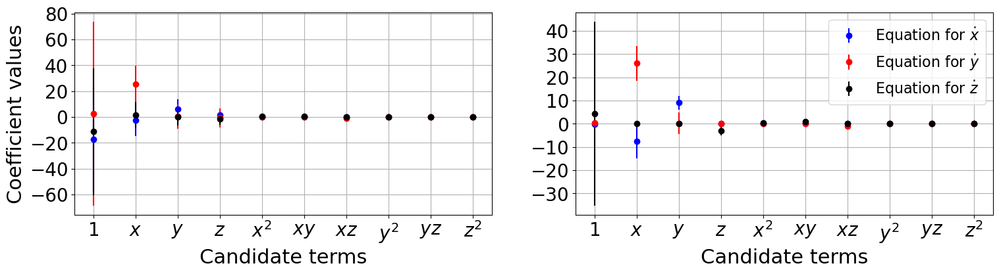

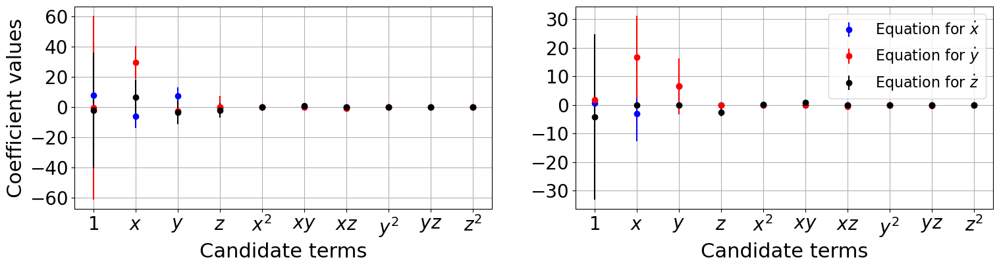

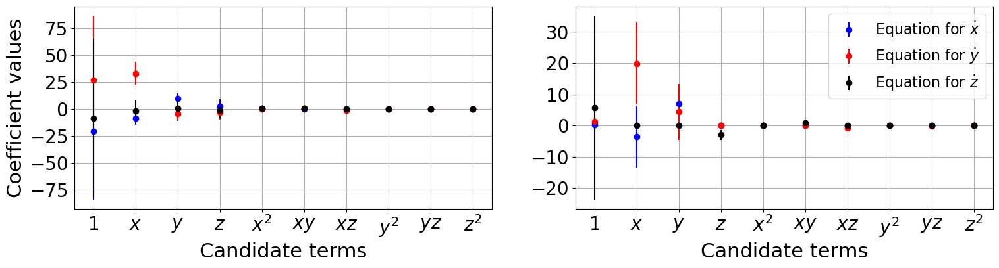

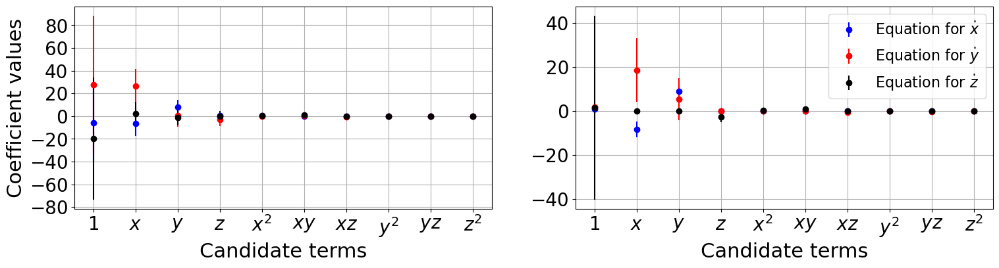

In [296]:
# first we discard 1 second of the data 
x_train_1_T = x_train[int(1/dt):,:]
rmse = mean_squared_error(x_train_1_T, np.zeros(x_train_1_T.shape), squared=False)
# 0.1%,1%,2.5%,5% noise
# Same random seed 
np.random.seed(123)
x_train_added_noise_01 = x_train_1_T + np.random.normal(0, rmse /1000,  x_train_1_T.shape)
x_train_added_noise_1 = x_train_1_T + np.random.normal(0, rmse /100,  x_train_1_T.shape)
x_train_added_noise_25 = x_train_1_T + np.random.normal(0, rmse /40,  x_train_1_T.shape)
x_train_added_noise_5 = x_train_1_T + np.random.normal(0, rmse /20,  x_train_1_T.shape)

# Have them in a single array to iterate through 
x_trains_added_noise = [x_train_added_noise_01, x_train_added_noise_1, x_train_added_noise_25, x_train_added_noise_5]
sparse_regression_optimizer = ps.STLSQ(threshold=0.3)

for x_train_train_added_noise in x_trains_added_noise:
    model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
    model.fit(x_train_added_noise, t=dt)
    # Fit many SINDy models with 2.5% added Gaussian noise
    model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
    model.fit(x_train_added_noise, t=dt, ensemble=True, quiet=True)
    ensemble_coefs = model.coef_list
    # Get average and standard deviation of the ensemble model coefficients
    mean_ensemble = np.mean(ensemble_coefs, axis=0)
    std_ensemble = np.std(ensemble_coefs, axis=0)
    # Now we sub-sample the library, generating multiple models. 
    # The default sampling omits a single library term.
    model = ps.SINDy(feature_names=feature_names, optimizer=sparse_regression_optimizer)
    model.fit(x_train, t=dt, library_ensemble=True, quiet=True)
    library_ensemble_coefs = model.coef_list

    # Get average and standard deviation of the library ensemble model coefficients
    mean_library_ensemble = np.mean(library_ensemble_coefs, axis=0)
    std_library_ensemble = np.std(library_ensemble_coefs, axis=0)


    plot_ensemble_results(
        model, 
        mean_ensemble, 
        std_ensemble, 
        mean_library_ensemble, 
        std_library_ensemble
    )

Discarding the 1st second of the data seemed to help a lot with the tendency to select non zero values for the 1 coefficient for x,y,z. However there is still a lot of standard deviation in the model determination when it comes to the 1 term coefficients that SINDY seem to want to select. All in all the method seems to give pretty robust results when using ensemble method despite the data being noisy. For reference look at the groundtruth below. 

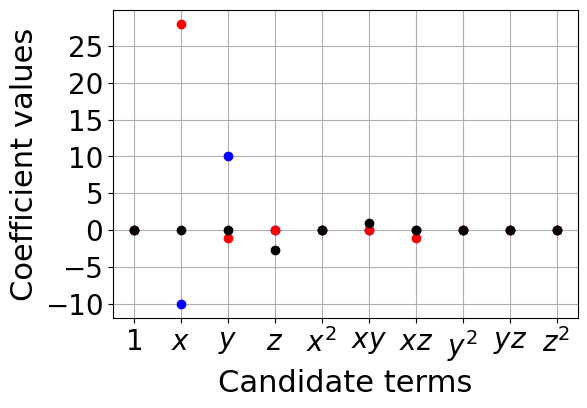

I conclude that pySINDY can be robust against noise if ensemble methods are used and part of data are discarded to avoid transient behavior.